<a href="https://colab.research.google.com/github/adichiara/DS-image-processing/blob/master/DermaScan_image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:

import pandas as pd
import numpy as np
import scipy as stats
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import PIL.Image
import webbrowser
import tkinter as tk
from PIL import ImageTk, Image
from IPython.display import Image, display
import csv 
from skimage import data, io, filters
from scipy.ndimage.measurements import center_of_mass
from skimage import morphology
import cv2
from google.colab.patches import cv2_imshow
import scipy
from scipy import ndimage

import os, sys
from google.colab import files

from google.colab.patches import cv2_imshow


In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

root_path = '/content/gdrive/My Drive/Work/DermaScan'  #change dir to your project folder

#!ls "/content/gdrive/My Drive/Work/DermaScan"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
img_list = ['/content/gdrive/My Drive/Adam/Work/DermaScan/t01.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t02.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t03.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t04.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t05.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t06.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t07.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t08.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t09.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t10.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t11.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t12.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t13.tiff',
            '/content/gdrive/My Drive/Adam/Work/DermaScan/t14.tiff']
            


In [0]:

image_list=[]
for i in img_list:
  image_list.append(cv2.imread(i,1))
  
image_array = np.array(image_list)



In [0]:
from numpy import asarray
from numpy import save
from numpy import load
save('data.npy', image_array)

data = load('data.npy')
# print the array
print(data.shape)

(14, 224, 1024, 3)


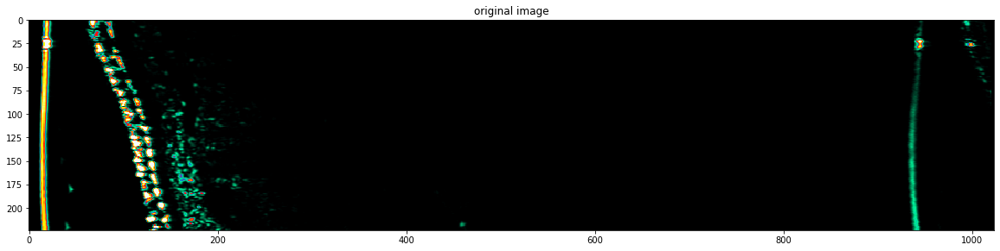

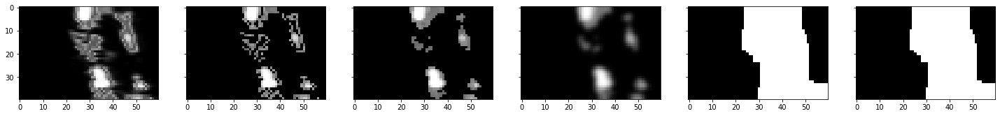

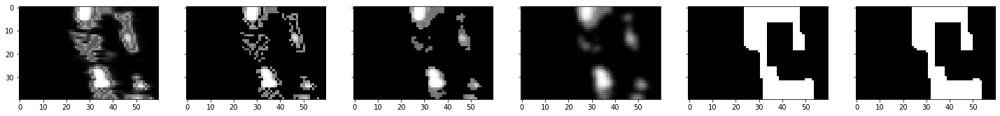

In [0]:

image = cv2.imread(img_list[0],1)
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


plt.figure(figsize=(20,10))
plt.imshow(img)
plt.title("original image")
plt.show() 

temp_img = image[0:40,40:100,:]
img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(temp_img, cv2.COLOR_BGR2GRAY)

ret,thresh1 = cv2.threshold(img_gray,100,255,cv2.THRESH_TOZERO)
im = ndimage.median_filter(thresh1,3)
blurred = cv2.GaussianBlur(im, (5,5), 0)

edge = cv2.Canny(thresh1, 175, 200)
edge = cv2.dilate(edge, None, iterations=5)
edge = cv2.erode(edge, None, iterations=5)
filled_edge = ndimage.binary_fill_holes(edge)


fig, axs = plt.subplots(ncols=6, figsize=(25,20), sharex=True, sharey=True, gridspec_kw={'hspace': .05})
axs[0].imshow(img_gray, cmap="gray")
axs[1].imshow(thresh1, cmap="gray")
axs[2].imshow(im, cmap="gray")
axs[3].imshow(blurred, cmap="gray")
axs[4].imshow(edge, cmap="gray")
axs[5].imshow(filled_edge, cmap="gray")


edge = cv2.Canny(blurred, 175, 200)
edge = cv2.dilate(edge, None, iterations=5)
edge = cv2.erode(edge, None, iterations=5)
filled_edge = ndimage.binary_fill_holes(edge)

fig, axs = plt.subplots(ncols=6, figsize=(25,20), sharex=True, sharey=True, gridspec_kw={'hspace': .05})
axs[0].imshow(img_gray, cmap="gray")
axs[1].imshow(thresh1, cmap="gray")
axs[2].imshow(im, cmap="gray")
axs[3].imshow(blurred, cmap="gray")
axs[4].imshow(edge, cmap="gray")
axs[5].imshow(filled_edge, cmap="gray")





In [0]:
image_array = load('/content/gdrive/My Drive/Adam/Work/DermaScan/dermascan image array.npy')
image_array.shape

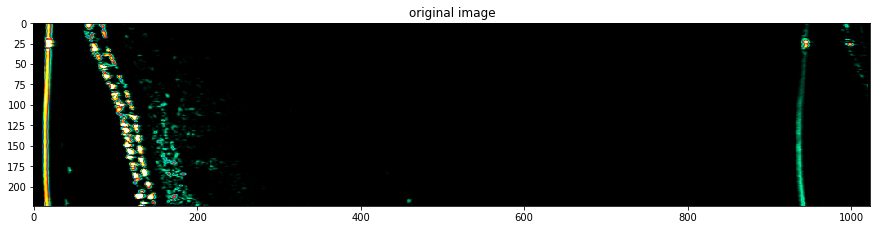

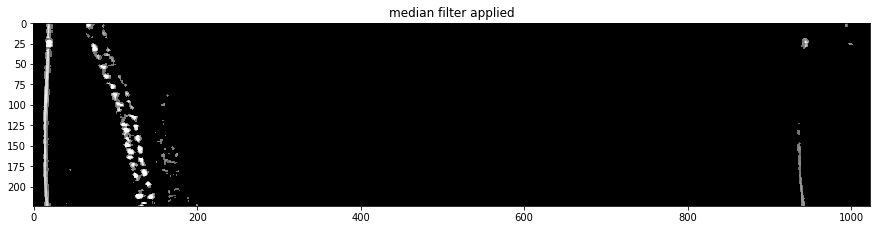

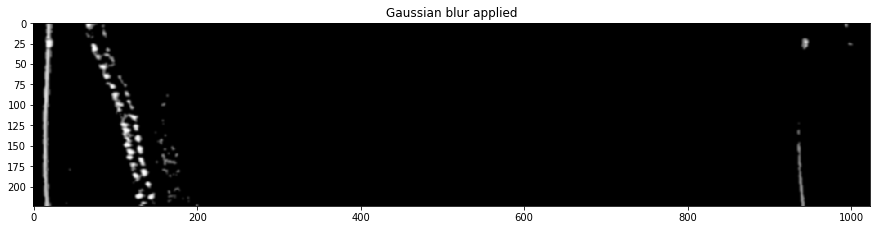

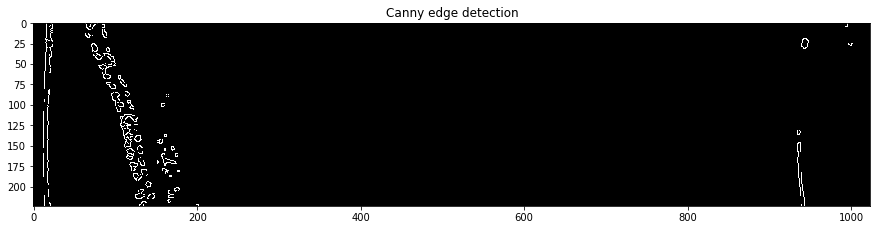

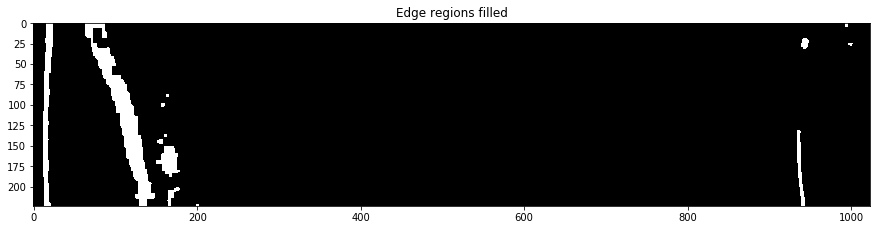

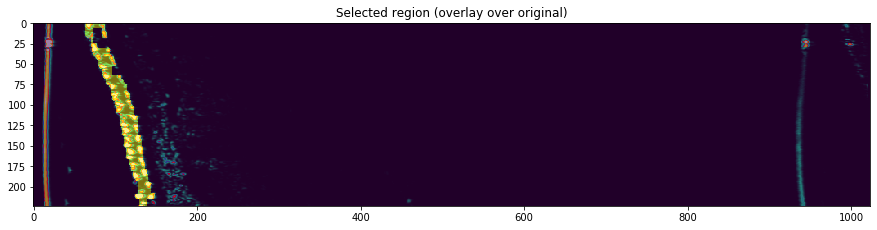

In [0]:
#image_array_3 = image_array[1]

for i in image_array[0:1]:
  
  img = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)

  ret,thresh1 = cv2.threshold(img_gray,100,255,cv2.THRESH_TOZERO)
  im = ndimage.median_filter(thresh1,3)
  blurred = cv2.GaussianBlur(im, (5,5), 0)

  edge = cv2.Canny(blurred, 175, 200)

  plt.figure(figsize=(15,10))
  plt.imshow(img)
  plt.title("original image")
  plt.savefig("original.png", bbox_inches='tight')
  plt.show() 

  plt.figure(figsize=(15,10))
  plt.imshow(im, cmap="gray")
  plt.title("median filter applied")
  plt.savefig("median.png", bbox_inches='tight')
  plt.show() 

  plt.figure(figsize=(15,10))
  plt.imshow(blurred, cmap="gray")
  plt.title("Gaussian blur applied")
  plt.savefig("blur.png", bbox_inches='tight')
  plt.show() 

  plt.figure(figsize=(15,10))
  plt.imshow(edge, cmap="gray")
  plt.title("Canny edge detection")
  plt.savefig("Canny.png", bbox_inches='tight')
  plt.show() 

 
  edge = cv2.dilate(edge, None, iterations=5)
  edge = cv2.erode(edge, None, iterations=5)

  filled_edge = ndimage.binary_fill_holes(edge)

  plt.figure(figsize=(15,10))
  plt.imshow(filled_edge, cmap="gray")
  plt.title("Edge regions filled")
  plt.savefig("filled.png", bbox_inches='tight')
  plt.show() 

  s = [[1,1,1],
      [1,1,1],
      [1,1,1]]

  labeled_array, num_features = scipy.ndimage.label(filled_edge, structure=s)

  centers = center_of_mass(labeled_array, labels=labeled_array, index=range(1, num_features+1))
  centers_x = np.round([i[1] for i in centers],0).astype("int")
  areas = np.bincount(labeled_array.flat)[1:]

  features_df = pd.DataFrame({"centers":centers_x, "areas":areas})
  features_df = features_df.set_index(features_df.index + 1)

  temp_df = features_df
  #print(temp_df)

  temp_df = temp_df.loc[temp_df["centers"] > temp_df.centers.min(),:]
  largest = temp_df["areas"].idxmax()
  temp_df = temp_df.loc[abs(temp_df["centers"] - temp_df.centers[largest]) <.1,:]
  temp_df = temp_df.loc[temp_df["areas"]/temp_df.areas[largest] >.4,:]
  #print(temp_df)  

  mask = np.isin(labeled_array, temp_df.index).astype("int")


  plt.figure(figsize=(15,10))
  plt.imshow(img, cmap="gray")
  plt.imshow(mask, alpha=.5)
  plt.title("Selected region (overlay over original)")
  plt.savefig("selected.png", bbox_inches='tight')
  plt.show() 

  # fig, axs = plt.subplots(nrows=3, figsize=(20,10), sharex=True, sharey=True, gridspec_kw={'hspace': .02})
  # axs[0].imshow(img, cmap="gray")
  # axs[1].imshow(filled_edge, cmap="gray")
  # axs[2].imshow(img, cmap="gray")
  # axs[2].imshow(mask, alpha=.5)





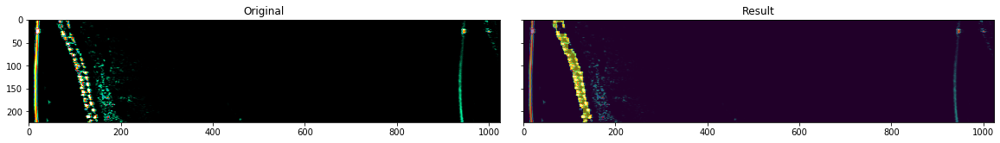

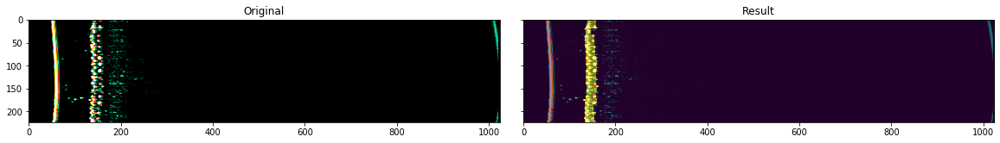

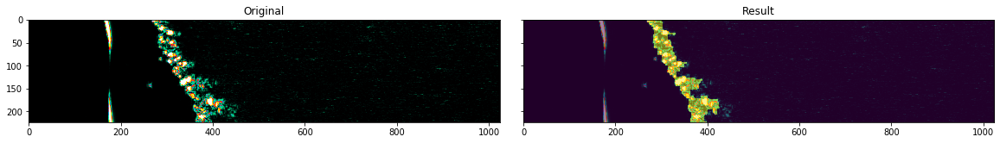

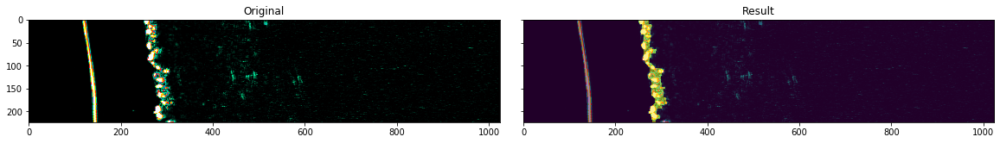

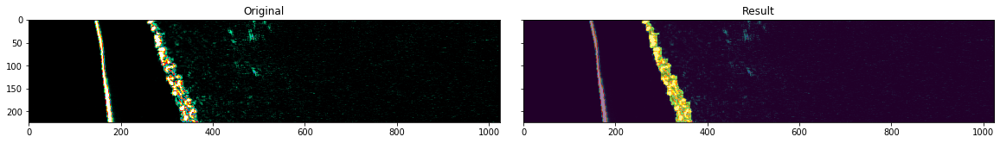

...

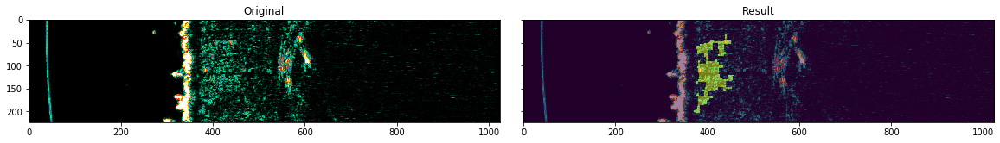

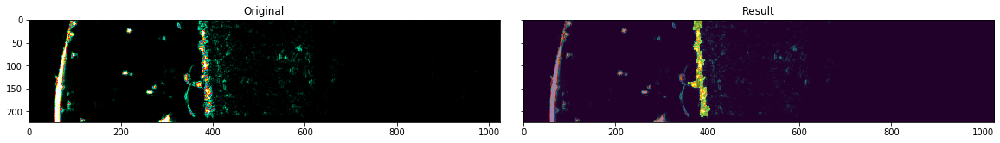

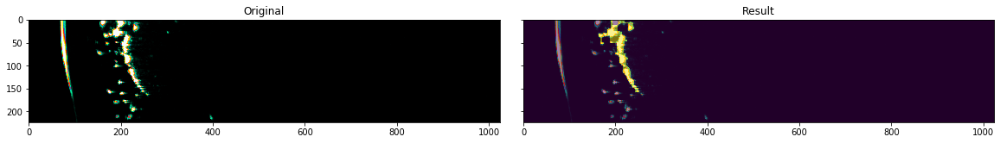

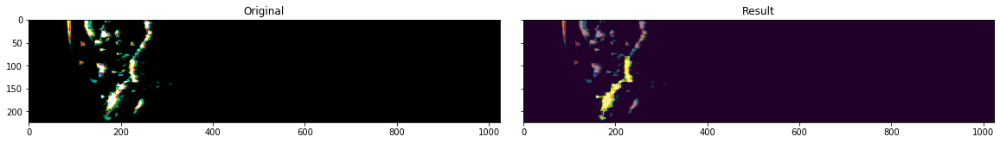

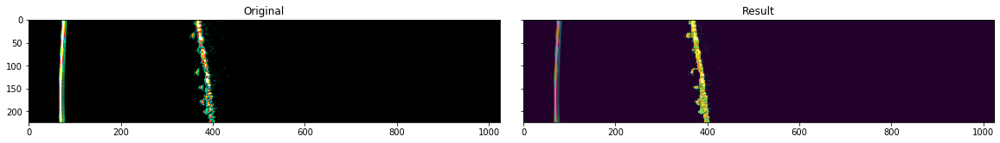

In [0]:
#image_array_3 = image_array[1]

for x, i in enumerate(image_array[0:20]):
  
  img = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)

  ret,thresh1 = cv2.threshold(img_gray,100,255,cv2.THRESH_TOZERO)
  im = ndimage.median_filter(thresh1,3)
  blurred = cv2.GaussianBlur(im, (5,5), 0)

  edge = cv2.Canny(blurred, 175, 200)
  edge = cv2.dilate(edge, None, iterations=5)
  edge = cv2.erode(edge, None, iterations=5)

  filled_edge = ndimage.binary_fill_holes(edge)


  s = [[1,1,1],
      [1,1,1],
      [1,1,1]]

  labeled_array, num_features = scipy.ndimage.label(filled_edge, structure=s)

  centers = center_of_mass(labeled_array, labels=labeled_array, index=range(1, num_features+1))
  centers_x = np.round([i[1] for i in centers],0).astype("int")
  areas = np.bincount(labeled_array.flat)[1:]

  features_df = pd.DataFrame({"centers":centers_x, "areas":areas})
  features_df = features_df.set_index(features_df.index + 1)

  temp_df = features_df
  #print(temp_df)

  temp_df = temp_df.loc[temp_df["centers"] > temp_df.centers.min(),:]
  largest = temp_df["areas"].idxmax()
  temp_df = temp_df.loc[abs(temp_df["centers"] - temp_df.centers[largest]) <.1,:]
  temp_df = temp_df.loc[temp_df["areas"]/temp_df.areas[largest] >.4,:]
  #print(temp_df)  

  mask = np.isin(labeled_array, temp_df.index).astype("int")

  fig, axs = plt.subplots(ncols=2, figsize=(20,10), sharex=True, sharey=True, gridspec_kw={'wspace': .05})
  axs[0].imshow(img, cmap="gray")
  axs[0].set_title('Original')
  #axs[1].imshow(filled_edge, cmap="gray")
  axs[1].imshow(img, cmap="gray")
  axs[1].imshow(mask, alpha=.5)
  axs[1].set_title('Result')
 
  image_filename = "example_" + str(x) + ".png"
  fig.savefig(image_filename, bbox_inches='tight')
  
  




In [0]:
print(i)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


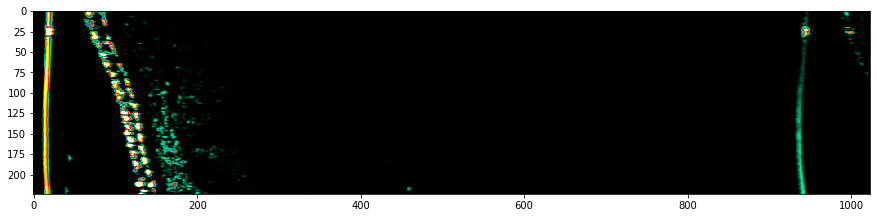

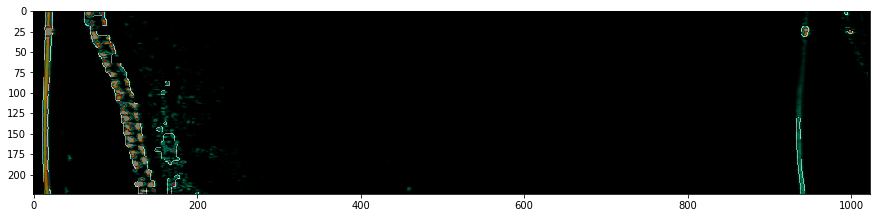

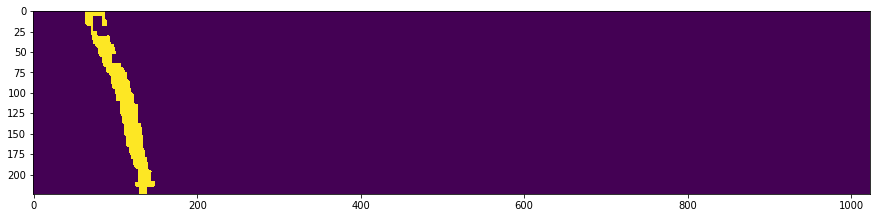

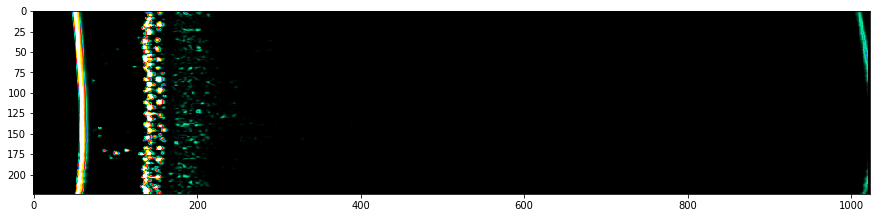

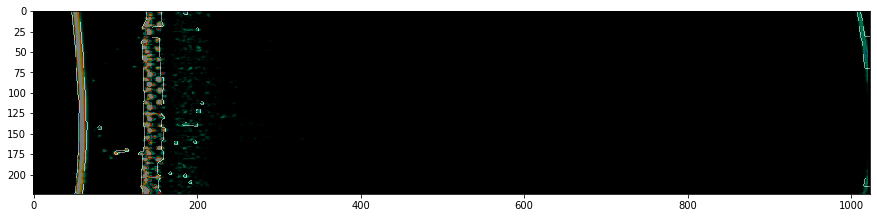

...

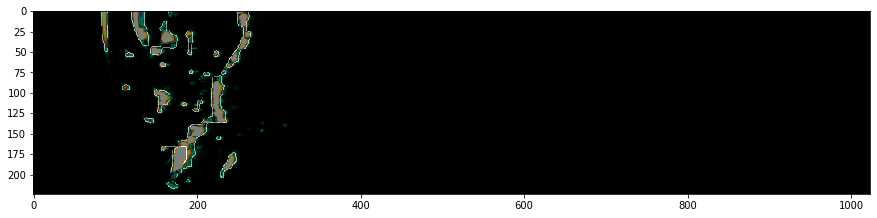

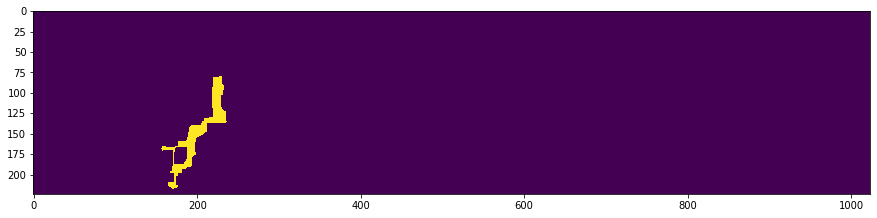

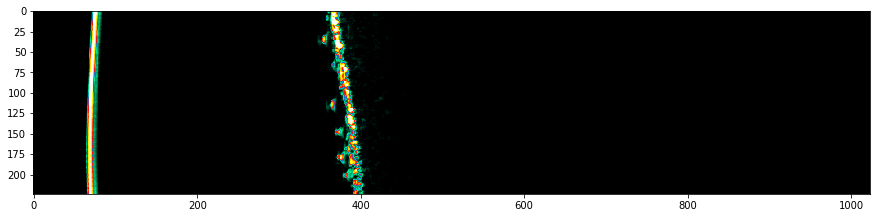

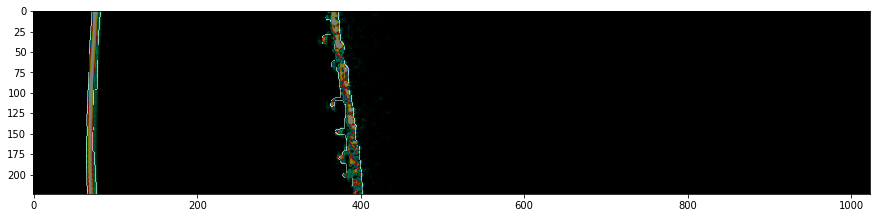

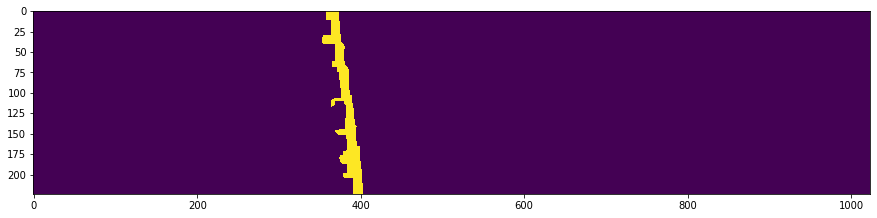

In [0]:

for i in img_list:
  image = cv2.imread(i,1)
  img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  ret,thresh1 = cv2.threshold(img_gray,100,255,cv2.THRESH_TOZERO)

  plt.figure(figsize=(15,10))
  plt.imshow(img)
  plt.show() 

  # plt.figure(figsize=(30,10))
  # plt.imshow(thresh1, cmap="gray")
  # plt.show() 

  im = ndimage.median_filter(thresh1,3)

  blurred = cv2.GaussianBlur(im, (5,5), 0)

  edge = cv2.Canny(blurred, 100, 200)
  edge = cv2.dilate(edge, None, iterations=5)
  edge = cv2.erode(edge, None, iterations=5)

  # plt.figure(figsize=(30,10))
  # plt.imshow(edge, cmap="gray")
  # plt.show() 

  # plt.figure(figsize=(30,10))
  # plt.imshow(img_gray, cmap="gray")
  # plt.imshow(edge, cmap='jet', alpha=0.4) 
  # plt.show() 

  # plt.figure(figsize=(30,10))
  # plt.imshow(img)
  # plt.imshow(edge, cmap='gray', alpha=0.35) 
  # plt.show() 

  edge_edge = cv2.Canny(edge, 225, 255)  
  plt.figure(figsize=(15,10))
  plt.imshow(img)
  #plt.imshow(edge, cmap='gray', alpha=0.5) 
  plt.imshow(edge_edge, cmap='gray', alpha=0.5) 
  plt.show() 


  s = [[1,1,1],
      [1,1,1],
      [1,1,1]]

  labeled_array, num_features = scipy.ndimage.label(edge, structure=s)

  feature_sizes=[0] * (num_features+1)

  for i in range(1,num_features+1):
    feature_sizes[i] = (labeled_array==i).sum()

  max_index = feature_sizes.index(max(feature_sizes))
  largest_object = labeled_array==max_index

  plt.figure(figsize=(15,10))
  plt.imshow(largest_object)
  plt.show()


2


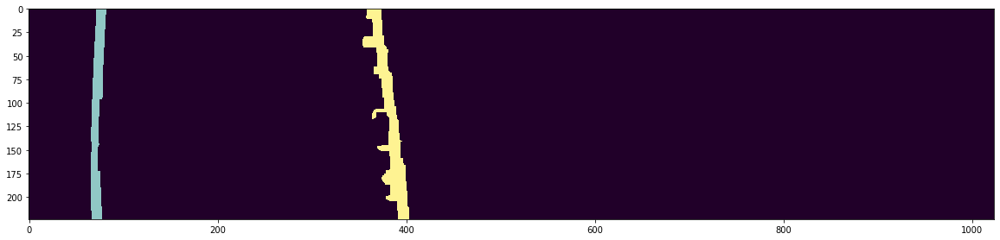

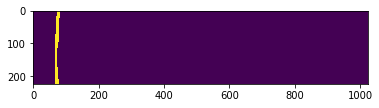

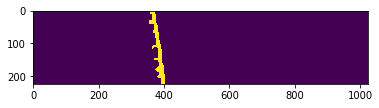

[0, 2125, 3299]
[2125, 3299]
[1, 2]


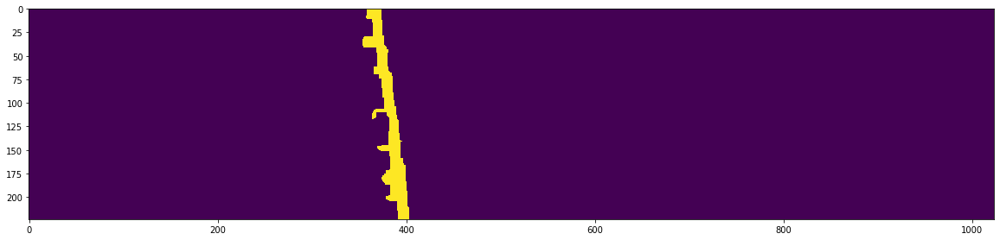

In [0]:
import scipy

s = [[1,1,1],
     [1,1,1],
     [1,1,1]]

labeled_array, num_features = scipy.ndimage.label(edge, structure=s)
print(num_features)

plt.figure(figsize=(20,10))
plt.imshow(edge, cmap="gray")
plt.imshow(labeled_array, alpha=.5)
plt.show()

for i in range(1,num_features+1):
  plt.imshow(labeled_array==i)
  plt.show()

feature_sizes=[0] * (num_features+1)

for i in range(1,num_features+1):
  feature_sizes[i] = (labeled_array==i).sum()

print(feature_sizes)

pct_cutoff = np.percentile(feature_sizes, 25)
feature_sizes_mains = [i for i in feature_sizes if i > pct_cutoff]
print(feature_sizes_mains)

feature_index_mains = [i for i, x in enumerate(feature_sizes) if x>pct_cutoff]

print(feature_index_mains)

features_main = labeled_array[feature_index_mains]

max_index = feature_sizes.index(max(feature_sizes))
largest_object = labeled_array==max_index

plt.figure(figsize=(20,10))
plt.imshow(largest_object)
plt.show()


3299
largest label: 1
[[  0 359]
 [  0 360]
 [  0 361]
 ...
 [223 401]
 [223 402]
 [223 403]]


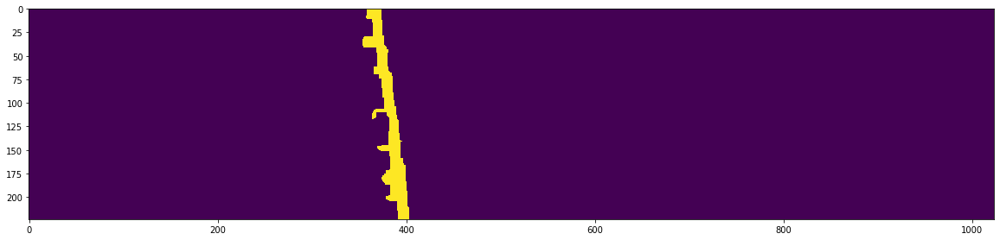

In [0]:

import skimage.measure
props = skimage.measure.regionprops(labeled_array)

largest_label=0

for i in range(1,len(props)):
  if(props[i].area > props[largest_label].area):
    largest_label=i
  print(props[i].area)

print("largest label:", largest_label)

print(props[largest_label].coords)
x,y = zip(*props[largest_label].coords)

plt.figure(figsize=(20,10))
#plt.scatter(y,x)
plt.imshow(largest_object)
plt.show()



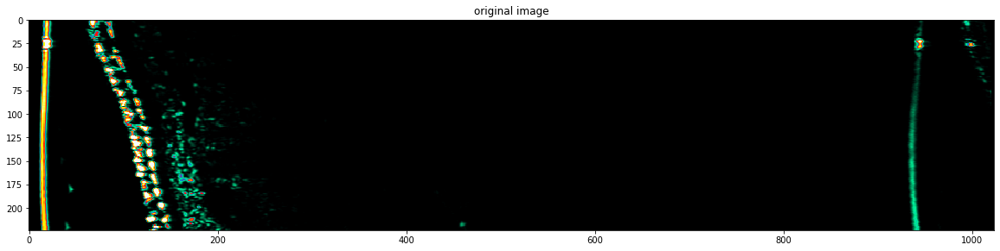

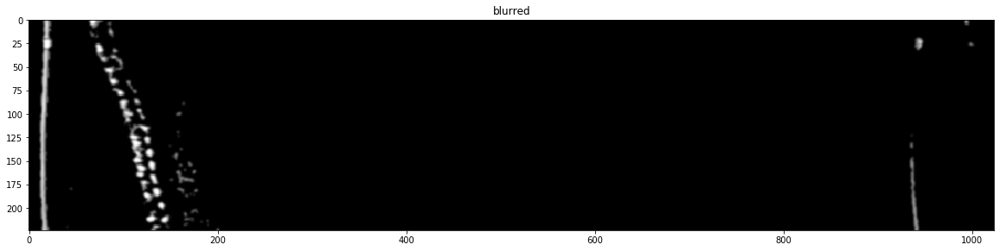

    centers  areas
1        17   1501
2       110   4147
3       995     25
4       944     92
5       999     19
6       164      9
7       159     19
8       938    404
9       162     16
10      156     39
11      166    640
12      169    140
13      200      8
   centers  areas
2      110   4147


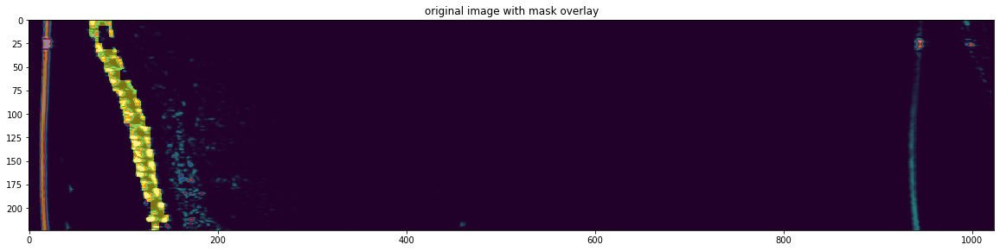

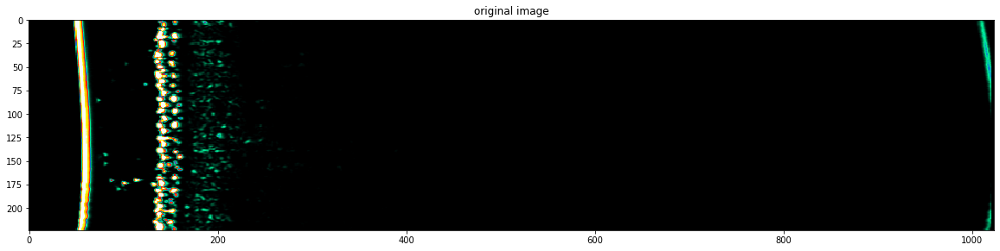

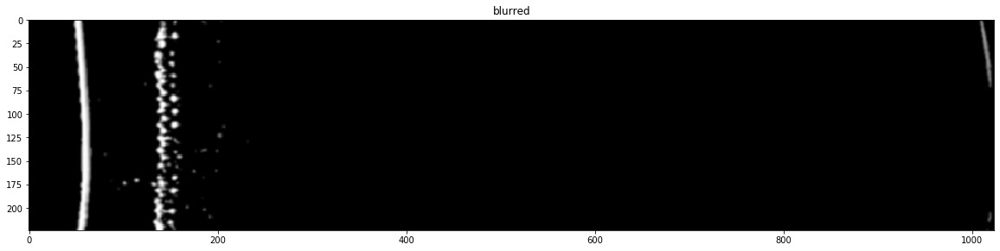

    centers  areas
1        58   2099
2       146   4789
3       185     16
4      1017    468
5       201     12
6       206     16
7       202     23
8       192     65
9        81      9
10      198     16
11      175     15
12      108     44
13      168     15
14      186     12
15     1020     64
16      192     13
   centers  areas
2      146   4789


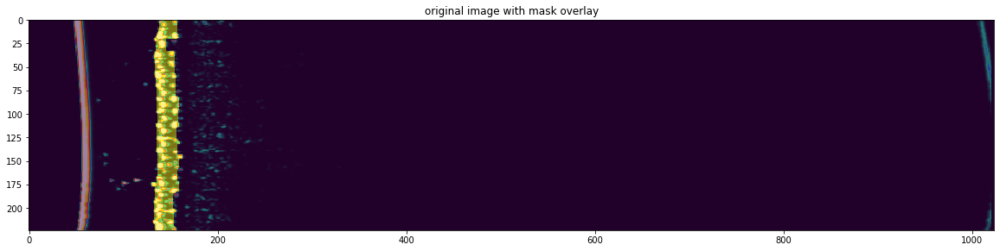

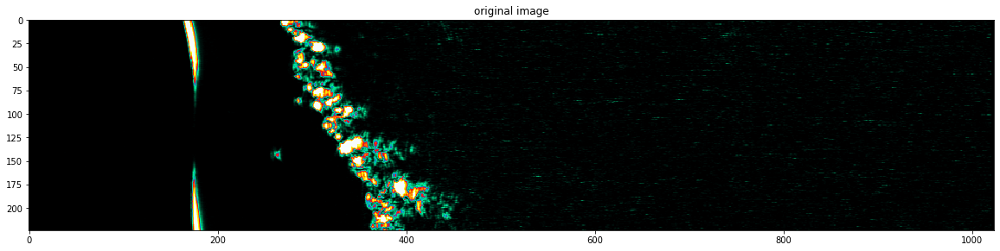

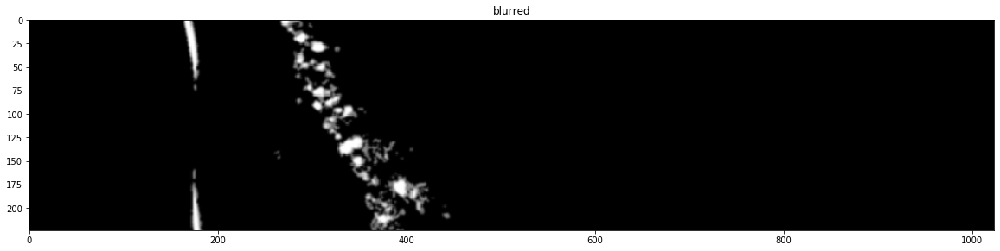

   centers  areas
1      174    583
2      343   8433
3      286     31
4      406     15
5      264     38
6      177    446
7      443     38
   centers  areas
2      343   8433


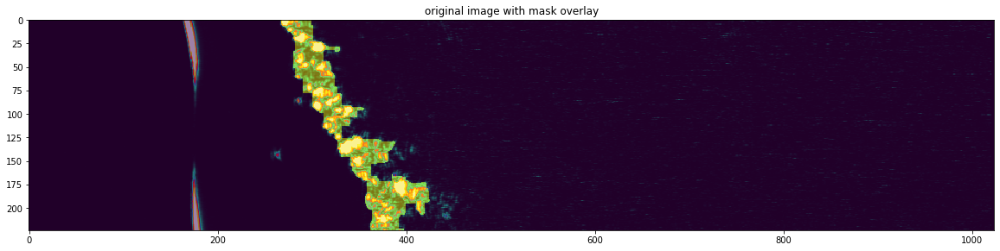

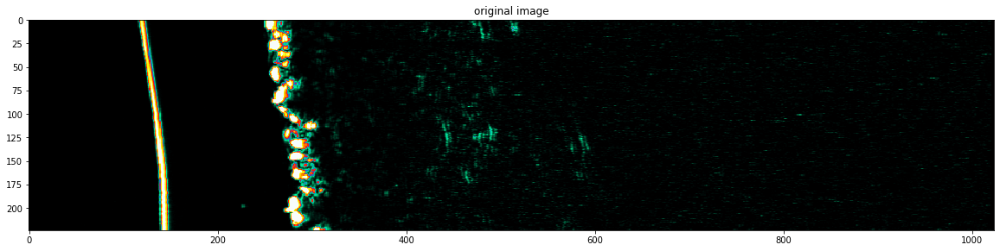

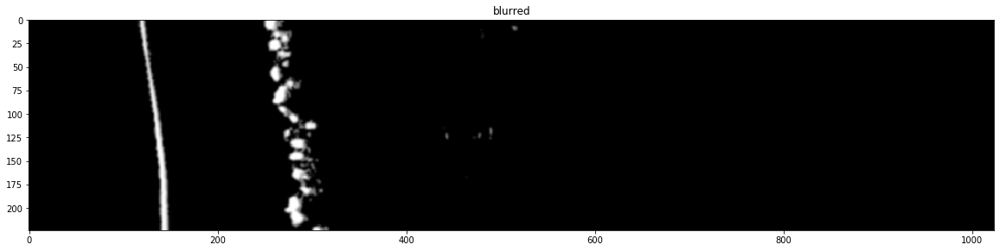

   centers  areas
1      136   1634
2      280   4609
3      515     24
4      485     66
5      443     22
6      309     75
   centers  areas
2      280   4609


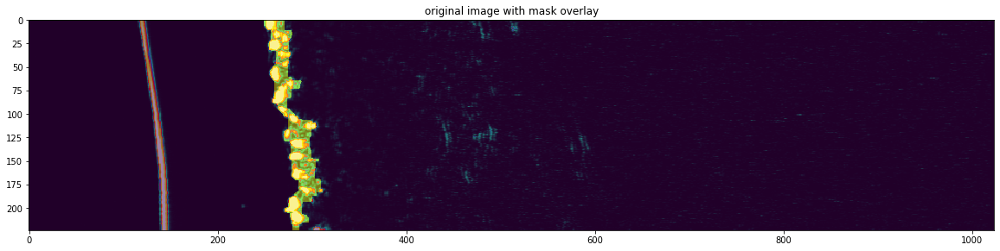

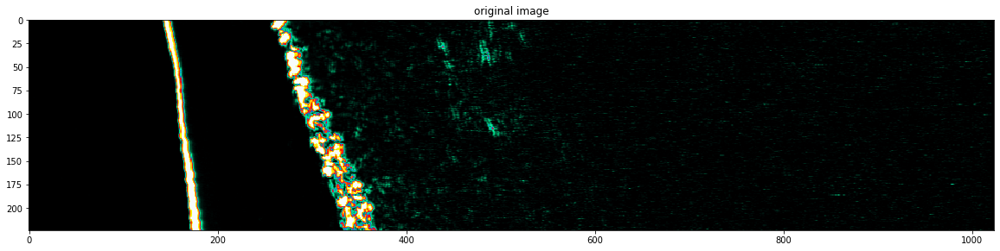

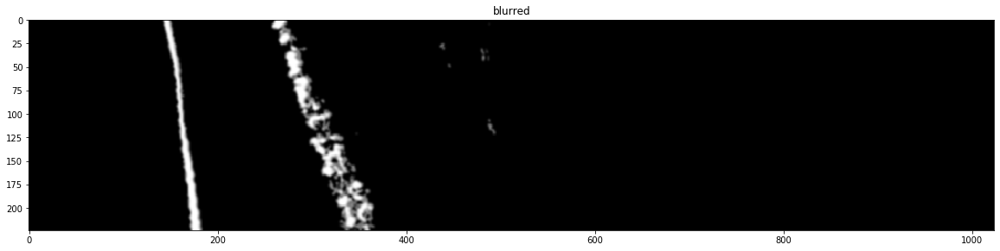

   centers  areas
1      164   1859
2      316   5867
3      439     36
4      481     54
5      446     17
6      490     77
   centers  areas
2      316   5867


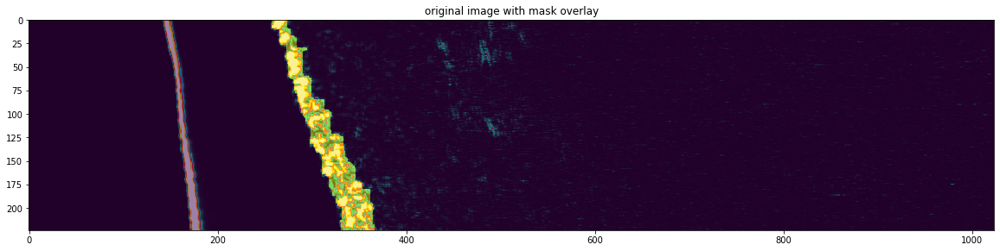

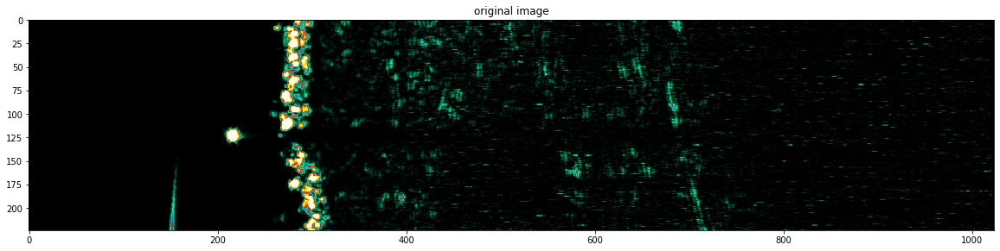

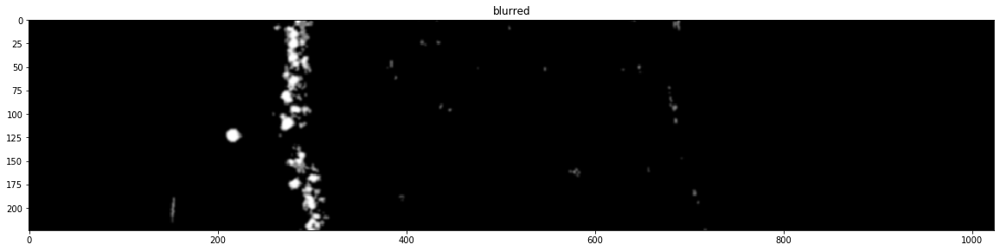

    centers  areas
1       283   3035
2       432      8
3       641     15
4       687     96
5       509     15
6       417     16
7       434     17
8       384     28
9       648     16
10      548     16
11      389     16
12      683    174
13      441     41
14      217    187
15      295   1846
16      580     73
17      707     44
18      395     17
19      153     85
20      717      6
   centers  areas
1      283   3035


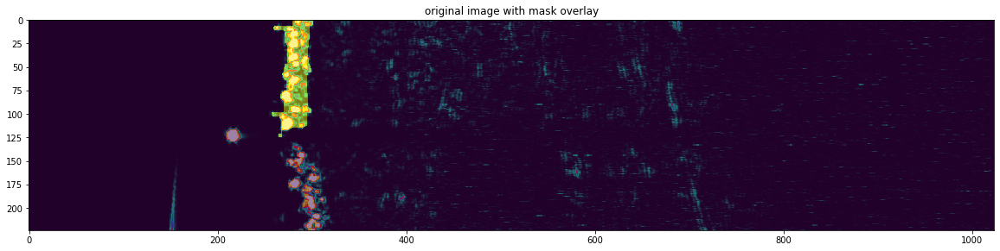

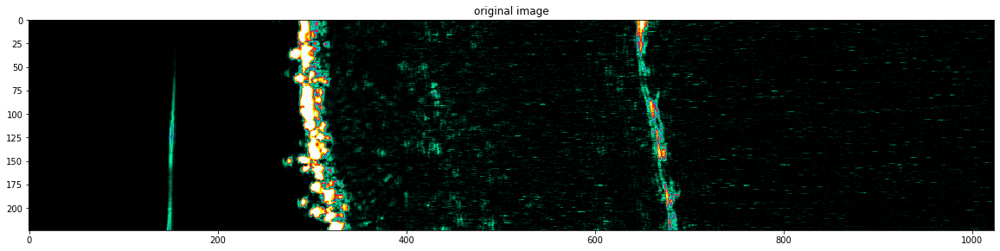

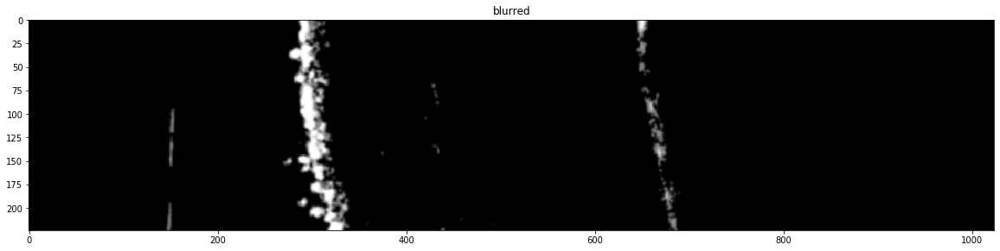

    centers  areas
1       306   6291
2       650    473
3       431     73
4       669   1471
5       151    248
6       433     38
7       374     14
8       290     74
9       149    126
10      439     10
   centers  areas
1      306   6291


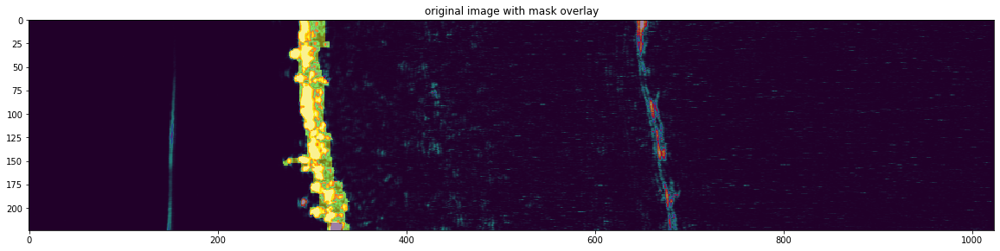

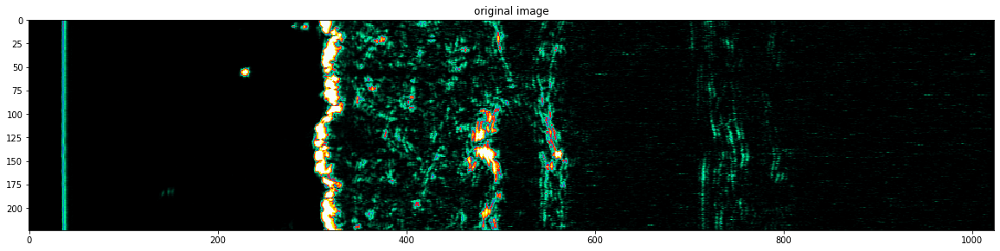

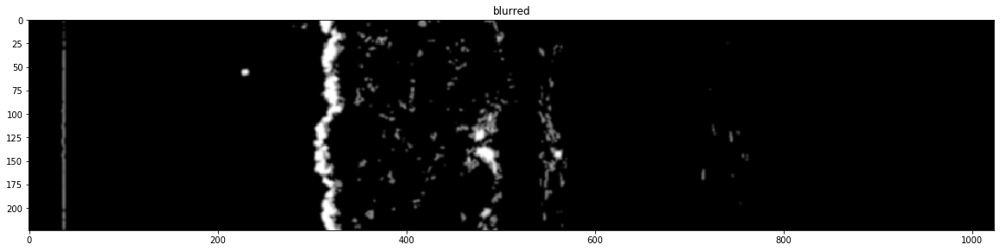

    centers  areas
1       292     46
2       322   4186
3       366    441
4       423    134
5       497    275
6       428     19
7       456    357
8        37    982
9       552    160
10      444     21
11      415     40
12      352     16
13      229     50
14      553   1658
15      511     46
16      403    286
17      483   2383
18      472     12
19      452     57
20      382    123
21      727     30
22      387    107
23      747     82
24      430     50
25      402     77
26      436     80
27      386      9
28      757     15
29      414     16
30      354     49
31      425    101
32      715     46
33      381    122
34      350     13
35      418     12
36      355    218
37      411     60
38      387     14
39      486    397
40      461     40
41      547     33
   centers  areas
2      322   4186


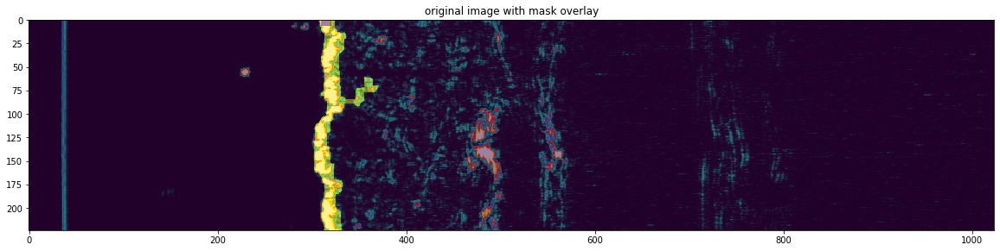

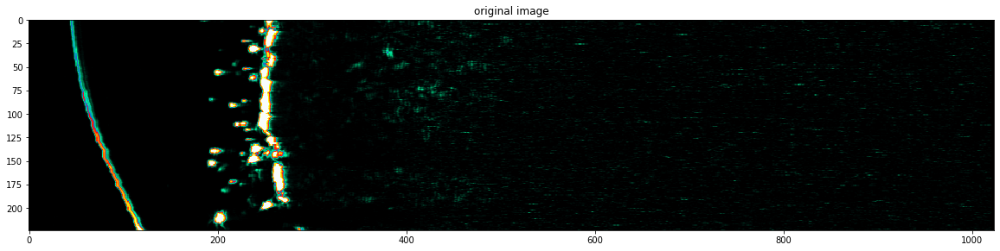

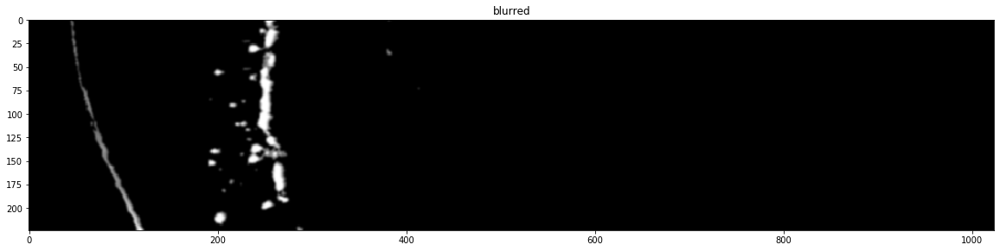

    centers  areas
1        79   1248
2       252   3606
3       382     13
4       382     29
5       201     51
6       228     14
7       217     32
8       196    140
9       203      9
10      215     26
11      207     15
12      203    117
13      287     26
   centers  areas
2      252   3606


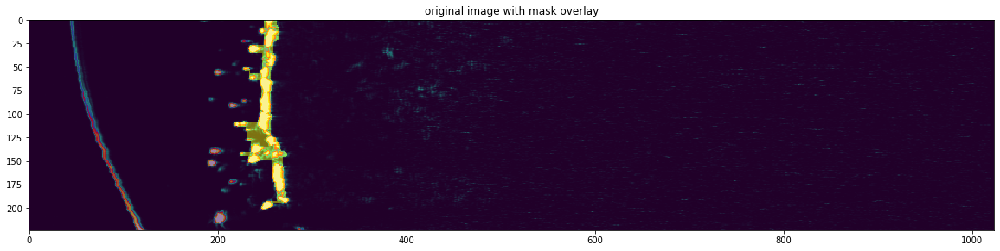

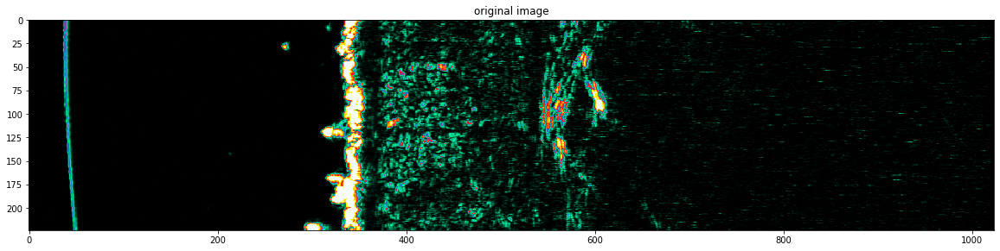

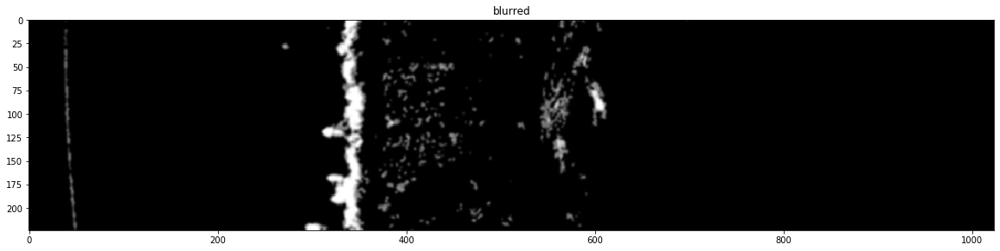

    centers  areas
1       341   5087
2       399     72
3       496      6
4       570    502
5       604     57
6       698      9
7        40    512
8       490     25
9       379     48
10      430     13
11      519     28
12      272     36
13      596   1073
14      407   5293
15      522     12
16      559   2354
17      473    159
18      438     18
19      438     28
20      523     49
21      488      3
22       47    234
23      588     25
24      472     48
25      592     12
26      487     13
27      472    202
28      574     50
29      386     93
30      422     63
31      507     85
32      306     87
33      584     28
    centers  areas
14      407   5293


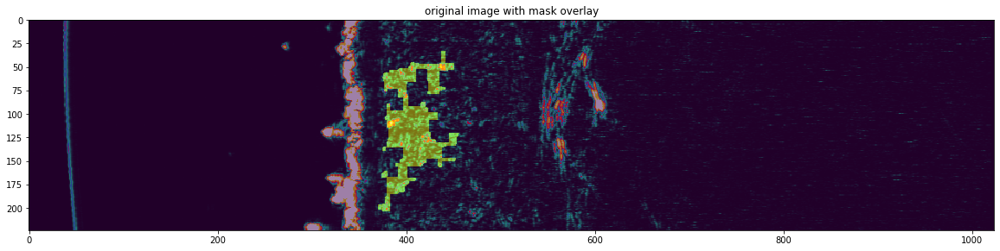

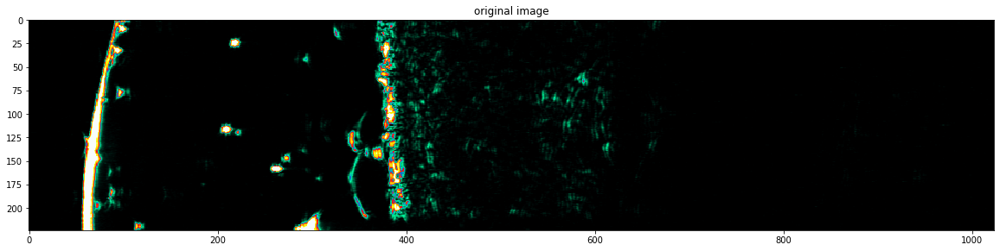

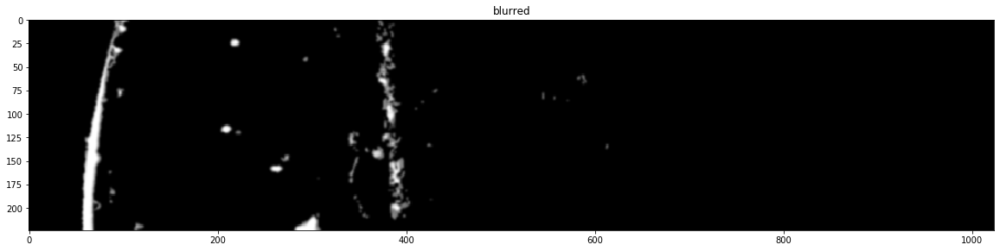

    centers  areas
1        74   2685
2       383   3206
3       327     29
4       219     62
5       293     24
6       587     73
7        97     46
8       431     19
9       550     67
10      213    120
11      344    118
12      424     15
13      613     19
14      266    141
15      344    117
16       86     16
17      346     17
18      351     35
19      299    195
20      357     30
21      117     64
   centers  areas
2      383   3206


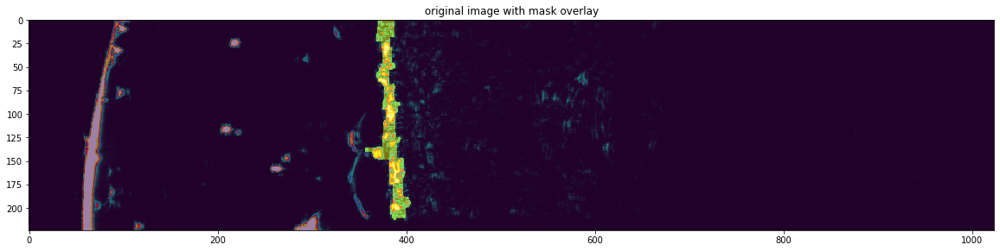

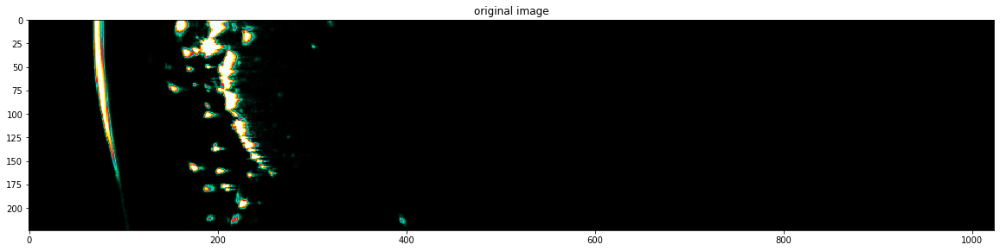

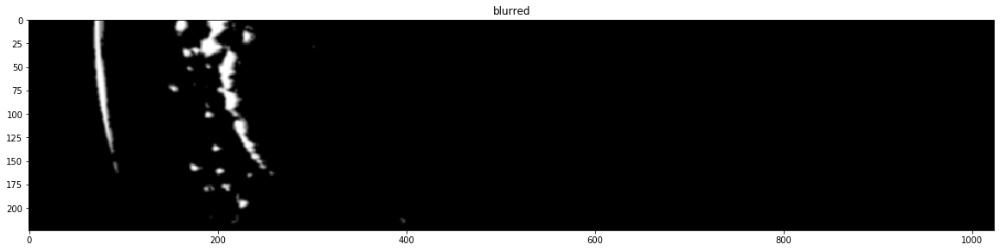

    centers  areas
1        78   1221
2       161    189
3       210   3140
4       154     54
5       190     89
6       198     50
7       177     67
8       202     47
9       257     26
10      234     20
11      200    153
12      225    104
13      397     22
14      217     17
   centers  areas
3      210   3140


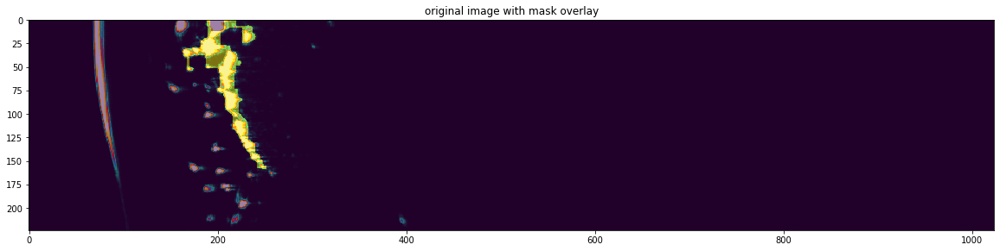

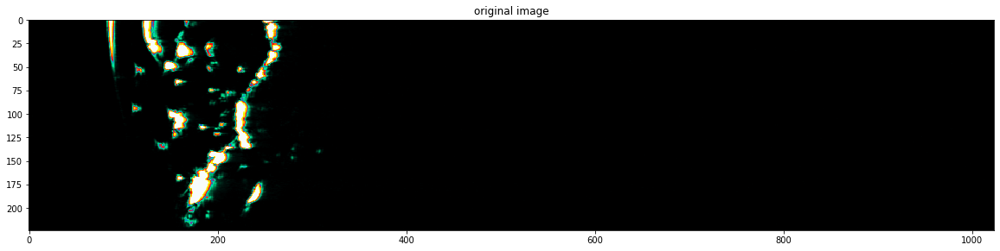

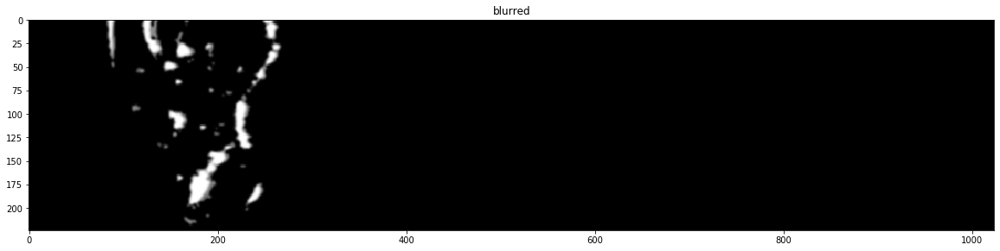

    centers  areas
1        88    307
2       131    597
3       167     14
4       254    662
5       160    525
6       192    143
7       224     32
8       118     41
9       159     32
10      193     21
11      233     22
12      212     26
13      200   2221
14      114     50
15      158    286
16      201     53
17      184     24
18      142     45
19      227     20
20      239    227
21      190     12
    centers  areas
13      200   2221


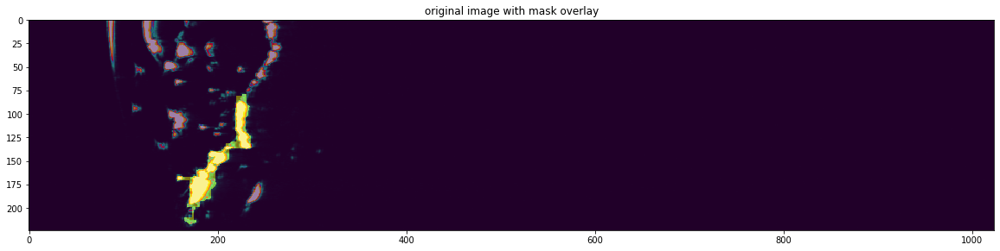

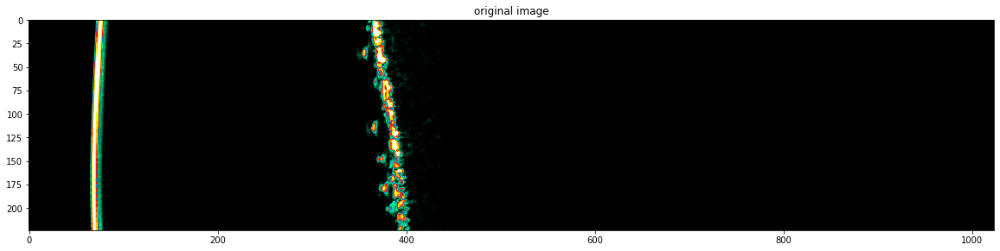

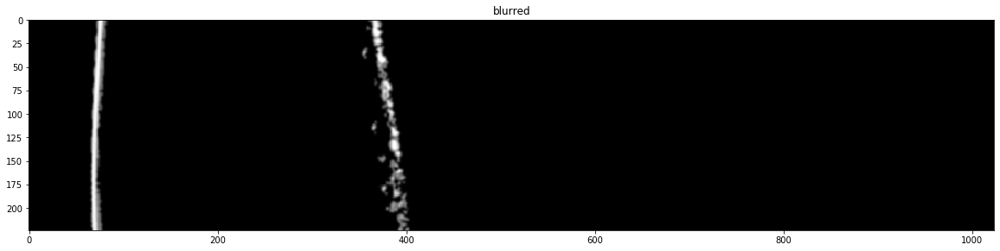

   centers  areas
1       72   2125
2      382   3269
   centers  areas
2      382   3269


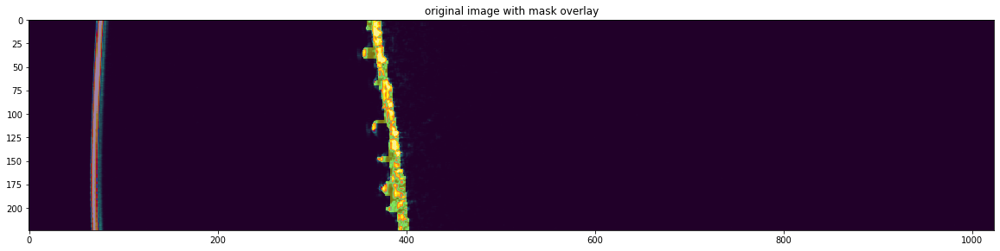

In [0]:
from scipy.ndimage.measurements import center_of_mass
from skimage import morphology

for i in img_list:

  image = cv2.imread(i,1)
  img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  plt.figure(figsize=(20,10))
  plt.imshow(img, cmap="gray")
  plt.title("original image")
  plt.show() 

  ret,thresh1 = cv2.threshold(img_gray,100,255,cv2.THRESH_TOZERO)

  # plt.figure(figsize=(20,10))
  # plt.imshow(thresh1, cmap="gray")
  # plt.title("threshold")
  # plt.show() 

  im = ndimage.median_filter(thresh1,3)
  
  # plt.figure(figsize=(20,10))
  # plt.imshow(im, cmap="gray")
  # plt.title("median_filter")
  # plt.show() 

  blurred = cv2.GaussianBlur(im, (5,5), 0)

  plt.figure(figsize=(20,10))
  plt.imshow(blurred, cmap="gray")
  plt.title("blurred")
  plt.show() 

  #ret,thresh_blurred = cv2.threshold(blurred,100,255,cv2.THRESH_TOZERO)

  # plt.figure(figsize=(20,10))
  # plt.imshow(thresh_blurred, cmap="gray")
  # plt.title("thresh_blurred")
  # plt.show() 

  #edge = cv2.Canny(thresh_blurred, 100, 200)
  edge = cv2.Canny(blurred, 175, 200)
  edge = cv2.dilate(edge, None, iterations=5)
  edge = cv2.erode(edge, None, iterations=5)
  filled_edge = ndimage.binary_fill_holes(edge)

  # plt.figure(figsize=(20,10))
  # plt.imshow(filled_edge, cmap="gray")
  # plt.title("canny with filled holes")
  # plt.show() 
  
  #large_edges = morphology.remove_small_objects(filled_edge, 21)
  #plt.figure(figsize=(20,10))
  #plt.imshow(large_edges, cmap="gray")
  #plt.show()

  #edge_edge = cv2.Canny(edge, 225, 255)

  s = [[1,1,1],
      [1,1,1],
      [1,1,1]]

  labeled_array, num_features = scipy.ndimage.label(filled_edge, structure=s)

  # plt.figure(figsize=(20,10))
  # plt.imshow(edge, cmap="gray")
  # plt.imshow(labeled_array, alpha=.5)
  # plt.show()

  centers = center_of_mass(labeled_array, labels=labeled_array, index=range(1, num_features+1))
  centers_x = np.round([i[1] for i in centers],0).astype("int")
  areas = np.bincount(labeled_array.flat)[1:]

  features_df = pd.DataFrame({"centers":centers_x, "areas":areas})
  features_df = features_df.set_index(features_df.index + 1)
  #print(features_df)

  # plt.scatter(features_df.centers, features_df.areas)
  # plt.xlim(0,1023)
  # plt.show()

  temp_df = features_df

  ## Tried cutoffs based on percentiles, but doesn't work well
  # center_25pct = np.percentile(temp_df["centers"], 25)
  # center_75pct = np.percentile(temp_df["centers"], 75)
  # temp_df = temp_df.loc[temp_df["centers"] > center_25pct,:]
  # temp_df = temp_df.loc[temp_df["centers"] < center_75pct,:]  
  # cutoff_pct = 90
  # cutoff_value = np.percentile(temp_df["areas"], cutoff_pct)
  # temp_df = temp_df.loc[temp_df["areas"]>(cutoff_value),:]

  print(temp_df)
  temp_df = temp_df.loc[temp_df["centers"] > temp_df.centers.min(),:]

  largest = temp_df["areas"].idxmax()
  temp_df = temp_df.loc[abs(temp_df["centers"] - temp_df.centers[largest]) <.1,:]
  temp_df = temp_df.loc[temp_df["areas"]/temp_df.areas[largest] >.4,:]

  print(temp_df)  

  # plt.scatter(temp_df.centers, temp_df.areas)
  # plt.xlim(0,1023)
  # plt.show()

  mask = np.isin(labeled_array, temp_df.index).astype("int")

  # plt.figure(figsize=(20,10))
  # plt.imshow(filled_edge, cmap="gray")
  # plt.imshow(mask, alpha=.5)
  # plt.title("cutoff mask")
  # plt.show()

  plt.figure(figsize=(20,10))
  plt.imshow(img, cmap="gray")
  plt.imshow(mask, alpha=.5)
  plt.title("original image with mask overlay")
  plt.show() 


In [0]:
#!pip install skimage.filter
from skimage.filters import sobel

for i in img_list:
  image = cv2.imread(i,1)
  img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  elevation_map = sobel(img_gray)

  plt.figure(figsize=(20, 10))
  plt.imshow(elevation_map, cmap=plt.cm.gray)
  plt.axis('off')
  plt.title('elevation_map')

  markers = np.zeros_like(img_gray)
  markers[img_gray < 100] = 1
  markers[img_gray > 200] = 2

  # plt.figure(figsize=(20, 10))
  # plt.imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
  # plt.axis('off')
  # plt.title('markers')

  segmentation = morphology.watershed(elevation_map, markers)

  fig,ax = plt.subplots(figsize=(20, 10))
  ax.imshow(segmentation, cmap=plt.cm.gray)
  ax.set_title('segmentation')
  ax.axis('off')

In [0]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb


image = cv2.imread(img_list[0],1)
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# apply threshold
thresh = threshold_otsu(img_gray)
bw = closing(img_gray > thresh, square(3))

# remove artifacts connected to image border
#cleared = clear_border(bw)

# label image regions
label_image = label(bw)
image_label_overlay = label2rgb(label_image, image=image)

plt.subplots(figsize=(20, 10))
plt.imshow(img, cmap="gray")
plt.show()

plt.subplots(figsize=(20, 10))
plt.imshow(image_label_overlay, cmap="gray")
plt.show()
